# Pulse-Level SNAP Preparation of a Fock State

Prepares the cavity Fock state $\lvert 1 \rangle$ from vacuum with a
SNAP + displacement circuit, compiles that circuit into physical drive waveforms, and
follows the Wigner function through the whole pulse sequence.

The circuit is $D(\alpha_3)\, S(\vec\theta_2)\, D(\alpha_2)\, S(\vec\theta_1)\, D(\alpha_1)$.
Each SNAP gate is realized by two number-multiplexed selective $\pi$ pulses whose
per-level relative phase sets the imparted phase (Heeres et al., *PRL* **115**, 137002);
the displacements are fast unselective Gaussians.

**Device.** Not the Eickbusch et al. cavity. That device has $\chi/2\pi = 32.8$ kHz by
design, which puts a selective $\pi$ pulse at $\sim 122$ us and a two-gate SNAP sequence
near a millisecond, against a cavity $T_1$ of $436$ us. SNAP control needs a *large*
dispersive shift, so this notebook loads `device_snap.toml` with
$\chi/2\pi = 2$ MHz, where $t_\pi = 4$ us and the whole sequence takes 16 us. The contrast
is the point: the same compiler, run on the two devices, reproduces exactly why ECD
control was developed.

**What actually limits the result.** Three things, in order:

1. *Selectivity.* The multiplexed components add coherently at the pulse centre, so the
   drive stops being a weak selective perturbation. Errors fall roughly as $1/t_\pi$ and
   grow with the number of levels driven.
2. *The padded-identity convention.* Two $\pi$ pulses impart $-e^{i\theta_n}$, whereas the
   optimizer pads unoptimized levels with $+1$. `snap_waveform` adds $\pi$ to the
   second-pulse phases so the two agree; without that the fidelity collapses.
3. *Truncation honesty.* A displacement in a truncated Fock space is unitary but is not a
   displacement. Left uncapped, the optimizer happily exploits that: an unconstrained run
   of this circuit reached a gate-level fidelity of $0.99999996$ using $|\alpha| = 4.5$,
   whose intermediate state needs $n \approx 33$ in a 16-level space. Capping $|\alpha|$
   is not a nicety.

## Imports

In [1]:
%load_ext autoreload
%autoreload 2

import time

import matplotlib.pyplot as plt
import numpy as np

import jax
import jax.numpy as jnp

from IPython.display import HTML

from gkp_optimal_control import pulses, pulse_simulation
from gkp_optimal_control.animation import animate_wigner
from gkp_optimal_control.gate_optimization import (
    GateBounds,
    OptimizerConfig,
    optimize_gate_sequence,
)
from gkp_optimal_control.plotting import plot_wigner, set_plot_style

set_plot_style()

## Device parameters from a config file

`pulses.load_config` reads JSON, YAML or TOML and returns a `SystemParams` plus whatever
other sections the file carries. Values may be bare numbers in internal units (us, rad/us,
1/us) or strings with an explicit unit.

The unit is worth writing every time. Quantities stored as angular frequencies — $\chi$,
$\chi'$, $K_c$, the drive ceilings — pick up the factor $2\pi$ when read from a quoted
frequency, while ordinary rates such as $\kappa$ do not. That factor is the single most
common source of silent errors here, and an unrecognized key raises rather than being
quietly dropped. A few aliases exist for the spellings the papers use: `two_kerr` halves
its value because Table S1 quotes $2 K_c$, and `t1_cavity` is inverted into $\kappa$.

In [5]:
params, cfg = pulses.load_config("./../devices/device_snap.toml")

print(open("../devices/device_snap.toml").read())
print(f"chi / 2pi        = {params.chi / (2 * np.pi):8.3f} MHz")
print(f"2 pi / chi       = {2 * np.pi / params.chi * 1e3:8.1f} ns")
print(f"t_pi (selective) = {params.t_snap_selective:8.3f} us  "
      f"({params.n_selective_periods} x 2 pi / chi)")
print(f"one SNAP gate    = {2 * params.t_snap_selective:8.3f} us")
print(f"cavity T1        = {1 / params.kappa:8.1f} us")
print(f"\nextra sections   : { {k: list(v) for k, v in cfg.items()} }")

snap_cfg = cfg["snap"]
n_fock = int(snap_cfg["n_fock"])
n_snap = int(snap_cfg["n_snap"])
n_gates = int(snap_cfg["n_gates"])
n_drive = int(snap_cfg["n_drive"])
max_disp = float(snap_cfg["max_disp"])

# A transmon-cavity device in the regime SNAP control was designed for
# (cf. Heeres et al., PRL 115, 137002): a large dispersive shift, so that
# number-selective pulses are microseconds rather than hundreds of them.
#
#   params, extras = pulses.load_config("device_snap.toml")

[system]
chi         = "2 MHz"       # 60x the Eickbusch device
chi_prime   = "1.5 Hz"
two_kerr    = "1.0 Hz"
t1_cavity   = "436 us"
anharm      = "193 MHz"
eps_max     = "400 MHz"
omega_max   = "20 MHz"
dt          = "1 ns"
sigma_disp  = "11 ns"
sigma_qubit = "6 ns"
n_selective_periods = 8     # 4 is not selective enough once several levels are multiplexed

[snap]
n_fock  = 16                # cavity truncation
n_snap  = 6                 # Fock phases optimized per gate: the occupied support
n_gates = 2                 # SNAP gates, hence 3 displacements
n_drive = 8                 # levels actually driven; see pulses.snap_waveform
max_disp = 1.5              # cap on |alpha| so intermediate states stay in t

## Gate-level circuit

Target $\lvert 1 \rangle$, two SNAP gates, phases optimized only on the levels the state
actually occupies (`n_snap = 6`) and displacements capped at $|\alpha| \le 1.5$.

Set `RUN_OPTIMIZATION = False` to use a stored solution. That solution was found with an
independent NumPy optimizer and reaches a gate-level fidelity of $0.9999982$ with
$|\alpha| = 0.70, 0.64, 0.37$, so the largest intermediate mean occupation is about $0.5$
photons: entirely inside a 16-level truncation.

In [6]:
from gkp_optimal_control.gate_results import gate_result_path, load_gate_result, save_gate_result
RUN_OPTIMIZATION = True

psi_target = np.zeros(n_fock, dtype=complex)
psi_target[1] = 1.0                      # Fock |1>
psi_vac = np.zeros(n_fock, dtype=complex)
psi_vac[0] = 1.0

_path = gate_result_path('data/gate_results/snap_fock_state_pulse_preparation', 'snap', n_gates)
if RUN_OPTIMIZATION:
    result = optimize_gate_sequence(
        "snap",
        n_gates=n_gates,
        psi_init=psi_vac,
        psi_targ=psi_target,
        n_fock=n_fock,
        n_snap=n_snap,
        loss_type="log_infidelity",
        bounds=GateBounds(max_disp=max_disp, max_disp_weight=10.0, n_leak=4),
        optimizer=OptimizerConfig(n_seeds=16, n_adam_iters=2000, seed=0),
        verbose=True,
    )
    save_gate_result(result, _path, initial_state=psi_vac, overwrite=True, source_notebook='snap_fock_state_pulse_preparation')
    print()
    print(result.summary())
    snap_phases = np.asarray(result.params["snap_phases"])
    alphas = np.asarray(result.params["alphas"])
elif _path.exists():
    result = load_gate_result(_path)
    print("loaded cached result from " + str(_path))
else:
    result = None
    snap_phases = np.array(
        [[-1.816329, -0.060074, -1.196930, -2.264764, 2.723509, 1.376941],
         [1.701759, 1.480007, -0.804355, 2.974925, 0.308271, -2.393577]]
    )
    alphas = np.array([-0.597528 + 0.372839j, -0.391610 - 0.509106j, -0.060448 - 0.361323j])

print(f"\n|alpha|        = {np.round(np.abs(alphas), 4)}")
print(f"max <n> from displacements alone = {np.abs(alphas).max() ** 2:.2f}")


def ideal_circuit(snap_phases, alphas, n_fock):
    # Reference SNAP circuit, mirroring gate_optimization._build_snap_sequence:
    # unoptimized levels are padded with phase zero.
    from scipy.linalg import expm

    a = np.diag(np.sqrt(np.arange(1, n_fock)), k=1).astype(complex)

    def disp(z):
        return expm(z * a.conj().T - np.conj(z) * a)

    psi = disp(alphas[0]) @ psi_vac
    out = [psi_vac.copy(), psi.copy()]
    for i in range(snap_phases.shape[0]):
        pad = np.concatenate([snap_phases[i], np.zeros(n_fock - snap_phases.shape[1])])
        psi = psi * np.exp(1j * pad)
        out.append(psi.copy())
        psi = disp(alphas[i + 1]) @ psi
        out.append(psi.copy())
    return psi, np.stack(out)


psi_ideal, ideal_history = ideal_circuit(snap_phases, alphas, n_fock)
print(f"gate-level F vs |1> = {abs(np.vdot(psi_target, psi_ideal)) ** 2:.8f}")

gate set : snap   depth : 2   n_fock : 16
params   : 18   state pairs : 1   reduction : mean
loss     : log_infidelity   disp : expm   seeds : 16   n_snap : 6
--------------------------------------------------------------
Adam (2000 iters x 16 seeds) in 15.4s
  seed fidelities: best 0.999997, median 0.999974, worst 0.993370
  best seed: 1
L-BFGS-B polish: 500 iters in 0.8s  ->  F = 0.999999
--------------------------------------------------------------
Final fidelity : 0.999999   (infidelity 1.189e-06)
Leakage        : 2.894e-08  (top 4 Fock levels)
Peak |disp|    : 0.656
Total time     : 17.5s

gate set        : snap
n_gates         : 2
n_params        : 18
fidelity        : 0.999999
infidelity      : 1.189e-06
loss            : -1.364249e+01
leakage         : 2.894e-08
best seed       : 1 of 16
seed F spread   : 0.9934 .. 1.0000

|alpha|        = [0.6556 0.6304 0.3687]
max <n> from displacements alone = 0.43
gate-level F vs |1> = 0.99999881


## Compiling to pulses

`compile_snap_sequence` emits the displacements and the two selective $\pi$ pulses per
gate on a uniform grid. Two settings matter.

`n_drive` is the number of Fock levels given a drive component, padded with
$\theta_n = 0$. It must cover the occupied support, but no more: every extra component
raises the peak amplitude at the pulse centre and degrades selectivity. Here 8 covers a
state whose population sits almost entirely in $n \le 3$.

`dt` must resolve the widest carrier, $\chi \times (n_\mathrm{drive} - 1)$. At
$\chi/2\pi = 2$ MHz and `n_drive = 8` that is 14 MHz, so 1 ns sampling gives about
0.09 rad of carrier phase per step.

The cavity drive is set to $\Delta = 0$: on resonance with the ground-state cavity
frequency, which is the frame in which the optimizer's diagonal phase gate is exactly the
ideal gate.

In [7]:
seq = pulses.compile_snap_sequence(
    snap_phases,
    alphas,
    params=params,
    delta=0.0,
    n_drive=n_drive,
    dt=1e-3,
    verbose=True,
)
print()
print(seq.summary())

carrier_max = params.chi * (n_drive - 1)
print(f"\nwidest carrier      : {carrier_max / (2 * np.pi):.1f} MHz  "
      f"({carrier_max * seq.dt:.3f} rad per sample)")
print(f"photons lost over T : {np.abs(alphas).max() ** 2 * params.kappa * seq.duration:.4f}")
print(f"ECD gate, same chi  : a few hundred ns, i.e. ~{seq.duration * 1e3 / 300:.0f}x shorter")

SNAP 1/2
SNAP 2/2

gate set        : snap
duration        : 16.1320 us  (16132 samples at 1.0 ns)
2 pi / chi       : 0.5000 us  (speedup 0.0x)
gates           : 2  (5 segments)
peak |eps|      : 4.42 MHz
peak |Omega|    : 0.93 MHz
max |alpha|     : 1.18  (max n = 1)
delta           : 0.00 kHz

widest carrier      : 14.0 MHz  (0.088 rad per sample)
photons lost over T : 0.0159
ECD gate, same chi  : a few hundred ns, i.e. ~54x shorter


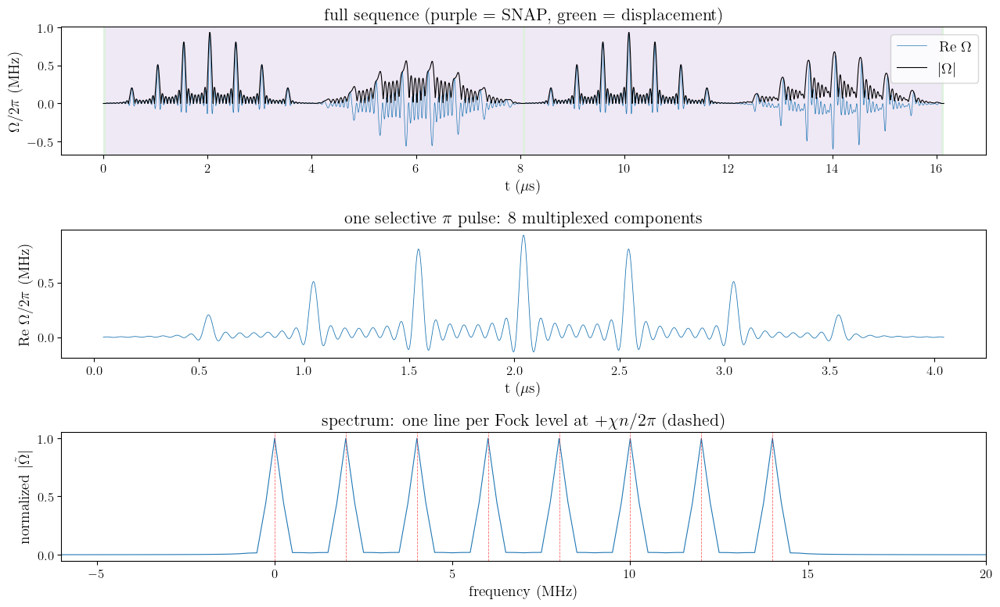

In [8]:
t_us = seq.t
fig, axes = plt.subplots(3, 1, figsize=(13, 8))

colors = {"displacement": "tab:green", "snap": "tab:purple"}
for s in seq.segments:
    axes[0].axvspan(s.start * seq.dt, s.stop * seq.dt,
                    color=colors.get(s.kind, "0.9"), alpha=0.15, lw=0)
axes[0].plot(t_us, np.real(seq.omega) / (2 * np.pi), lw=0.5, label=r"Re $\Omega$")
axes[0].plot(t_us, np.abs(seq.omega) / (2 * np.pi), lw=0.8, color="k",
             label=r"$|\Omega|$")
axes[0].set_ylabel(r"$\Omega/2\pi$ (MHz)")
axes[0].set_xlabel(r"t ($\mu$s)")
axes[0].set_title("full sequence (purple = SNAP, green = displacement)")
axes[0].legend(loc="upper right")

# zoom on the first selective pulse: the multiplexed components beat against
# each other, adding coherently only at the pulse centre
seg = next(s for s in seq.segments if s.kind == "snap")
sl = slice(seg.start, seg.start + (seg.stop - seg.start) // 2)
axes[1].plot(t_us[sl], np.real(seq.omega[sl]) / (2 * np.pi), lw=0.6)
axes[1].set_ylabel(r"Re $\Omega/2\pi$ (MHz)")
axes[1].set_xlabel(r"t ($\mu$s)")
axes[1].set_title(f"one selective $\\pi$ pulse: {n_drive} multiplexed components")

# spectrum: a comb of lines at +chi n / 2 pi
om_seg = seq.omega[sl]
freq = np.fft.fftshift(np.fft.fftfreq(om_seg.size, d=seq.dt))
spec = np.abs(np.fft.fftshift(np.fft.fft(om_seg)))
axes[2].plot(freq, spec / spec.max(), lw=0.8)
for n in range(n_drive):
    axes[2].axvline(params.chi * n / (2 * np.pi), color="r", lw=0.6, ls="--", alpha=0.6)
axes[2].set_xlim(-3 * params.chi / (2 * np.pi), (n_drive + 2) * params.chi / (2 * np.pi))
axes[2].set_xlabel("frequency (MHz)")
axes[2].set_ylabel("normalized $|\\tilde\\Omega|$")
axes[2].set_title(r"spectrum: one line per Fock level at $+\chi n / 2\pi$ (dashed)")

fig.tight_layout()
plt.show()

## Simulation

The displacements here are of order $|\alpha| \sim 0.7$, so there is nothing to gain from
the displaced frame and `frame="lab"` is the natural choice: $\alpha(t) \equiv 0$, the
cavity drive stays explicit, and no frame bookkeeping is needed. (For ECD sequences at
$\alpha_0 = 30$ the opposite is true, which is what the displaced frame exists for.)

`truncation_error` reports the peak population in the top few Fock levels and is the first
thing to check.

In [9]:
t0 = time.time()
res = pulse_simulation.simulate_sequence(
    seq,
    psi0=psi_vac,
    n_fock=n_fock,
    n_transmon=2,
    save_every=max(1, seq.n_samples // 150),
    frame="lab",
    method="eigh",
)
print(f"propagated {seq.n_samples} steps (dim {2 * n_fock}) in {time.time() - t0:.1f} s")
print(f"saved frames     : {res.states.shape[0]}")
print(f"truncation error : {res.truncation_error():.2e}")
print(f"P(g) at the end  : {res.p_ground()[-1]:.5f}")
print(f"max <n>          : {res.photon_number(lab=True).max():.3f}")

psi_out = res.final_cavity_state(project="ground", apply_frame=False)
f_target = res.fidelity(psi_target, apply_frame=False)
f_circuit = float(abs(np.vdot(psi_ideal / np.linalg.norm(psi_ideal), psi_out)) ** 2)
print(f"\nF(cavity | g) vs Fock |1>       : {f_target:.6f}")
print(f"F(cavity | g) vs ideal circuit  : {f_circuit:.6f}")
print("  -> the two agree, so the pulse error dominates over the circuit's own error")

propagated 16132 steps (dim 32) in 1.3 s
saved frames     : 156
truncation error : 2.73e-08
P(g) at the end  : 0.95120
max <n>          : 1.122

F(cavity | g) vs Fock |1>       : 0.998006
F(cavity | g) vs ideal circuit  : 0.998011
  -> the two agree, so the pulse error dominates over the circuit's own error


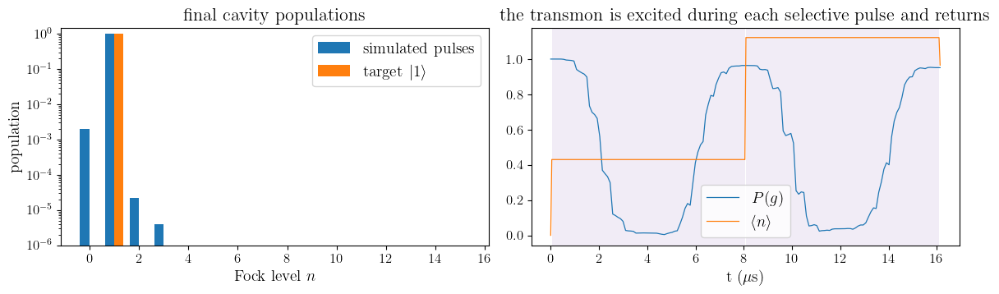

In [10]:
fig, axes = plt.subplots(1, 2, figsize=(12, 3.8))

width = 0.38
levels = np.arange(n_fock)
axes[0].bar(levels - width / 2, np.abs(psi_out) ** 2, width, label="simulated pulses")
axes[0].bar(levels + width / 2, np.abs(psi_target) ** 2, width, label="target $|1\\rangle$")
axes[0].set_xlabel("Fock level $n$")
axes[0].set_ylabel("population")
axes[0].set_yscale("log")
axes[0].set_ylim(1e-6, 1.5)
axes[0].set_title("final cavity populations")
axes[0].legend()

axes[1].plot(res.times, res.p_ground(), lw=0.9, label=r"$P(g)$")
axes[1].plot(res.times, res.photon_number(lab=True), lw=0.9, label=r"$\langle n \rangle$")
for s in seq.segments:
    if s.kind == "snap":
        axes[1].axvspan(s.start * seq.dt, s.stop * seq.dt, color="tab:purple",
                        alpha=0.12, lw=0)
axes[1].set_xlabel(r"t ($\mu$s)")
axes[1].set_title("the transmon is excited during each selective pulse and returns")
axes[1].legend()

fig.tight_layout()
plt.show()

## Wigner trajectory

`wigner_frames` traces the cavity out of the joint state and hands each frame to
`utils.wigner_trajectory`. Tracing rather than projecting matters mid-sequence: between
the two $\pi$ pulses of a SNAP gate the transmon is genuinely excited and entangled with
the cavity, so projecting on $\lvert g\rangle$ there would show a spuriously pure state.

Watch for the vacuum blob displacing, the SNAP gates reshaping it in place — a SNAP gate
is diagonal in Fock space, so it does not move the distribution, it rotates the phase of
each ring — and the last displacement bringing it onto the ring-with-negative-centre that
is $\lvert 1 \rangle$.

156 frames on a 90x90 grid


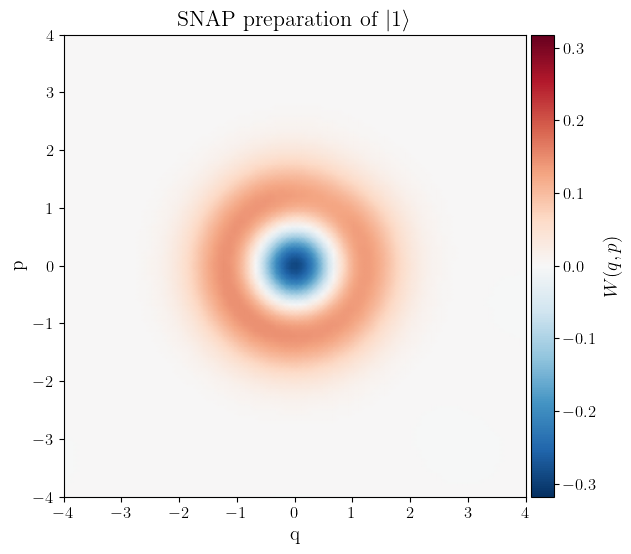

In [15]:
xvec, yvec, wig, offsets = pulse_simulation.wigner_frames(
    res, x_bound=4.0, y_bound=4.0, grid_points=90, project="traced", frame="lab"
)
print(f"{wig.shape[0]} frames on a {wig.shape[1]}x{wig.shape[2]} grid")

anim = animate_wigner(
    wig, xvec, yvec, title=r"SNAP preparation of $|1\rangle$", interval=60
)
HTML(anim.to_jshtml())

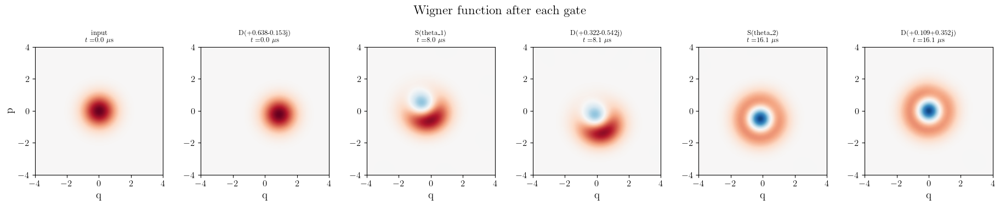

In [12]:
labels, cav_states, _ = pulse_simulation.gate_boundary_states(res, project="traced")
xg, yg, wig_gates, _ = pulse_simulation.wigner_frames(
    res, x_bound=4.0, y_bound=4.0, grid_points=120, project="traced", frame="comoving"
)
sel = np.searchsorted(res.save_indices,
                      np.concatenate([[0], np.asarray(seq.gate_indices, dtype=int)]))
sel = np.clip(sel, 0, wig_gates.shape[0] - 1)

fig, axes = plt.subplots(1, len(sel), figsize=(3.1 * len(sel), 3.4))
wmax = np.abs(wig_gates[sel]).max()
for ax, i, lbl in zip(np.atleast_1d(axes), sel, labels):
    ax.imshow(wig_gates[i], origin="lower",
              extent=(xg[0], xg[-1], yg[0], yg[-1]),
              cmap="RdBu_r", vmin=-wmax, vmax=wmax, aspect="equal")
    ax.set_title(f"{lbl}\n" + r"$t = $" + f"{res.times[i]:.1f}" + r" $\mu$s", fontsize=9)
    ax.set_xlabel("q")
np.atleast_1d(axes)[0].set_ylabel("p")
fig.suptitle("Wigner function after each gate", y=1.03)
fig.tight_layout()
plt.show()

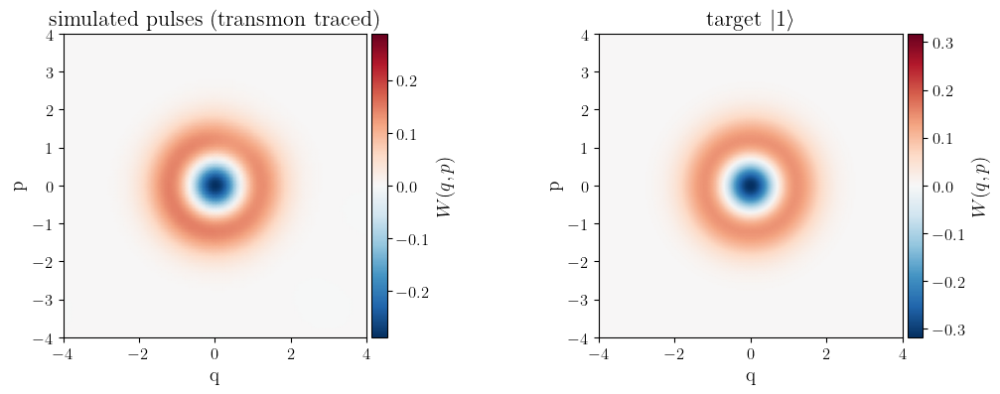

In [13]:
fig, axes = plt.subplots(1, 2, figsize=(11, 4.2))
plot_wigner(wigner=wig[-1], xvec=xvec, yvec=yvec, ax=axes[0],
            title="simulated pulses (transmon traced)")
psi_t = np.zeros(n_fock, dtype=complex)
psi_t[1] = 1.0
plot_wigner(state=psi_t, x_bound=4.0, y_bound=4.0, ax=axes[1],
            title=r"target $|1\rangle$")
fig.tight_layout()
plt.show()

## How many levels to drive

`n_drive` trades two errors against each other. Too few and the population above it is
driven only by the off-resonant tails of the selective pulses. Too many and the components
add up at the pulse centre, breaking selectivity for every level.

For this circuit the state is concentrated in $n \le 3$, so the trade-off is one-sided and
the smallest sufficient `n_drive` wins. A NumPy reference run of exactly this sweep gave
$F = 0.9996,\ 0.9993,\ 0.9984$ and $P(g) = 0.980,\ 0.974,\ 0.957$ for
`n_drive` $= 8, 10, 16$. Note that the lost $P(g)$ is population left in $\lvert e\rangle$
— it reduces the postselected yield rather than corrupting the postselected state, which
is why $F$ degrades far more slowly than $P(g)$.

In [14]:
rows = []
for nd in (8, 10, 16):
    seq_nd = pulses.compile_snap_sequence(
        snap_phases, alphas, params=params, delta=0.0, n_drive=nd, dt=1e-3
    )
    res_nd = pulse_simulation.simulate_sequence(
        seq_nd, psi0=psi_vac, n_fock=n_fock, save_every=seq_nd.n_samples,
        frame="lab", method="eigh",
    )
    rows.append((nd, seq_nd.duration,
                 res_nd.fidelity(psi_target, apply_frame=False),
                 res_nd.p_ground()[-1],
                 np.abs(seq_nd.omega).max() / (2 * np.pi)))

print(f"{'n_drive':>8} {'T (us)':>8} {'F':>10} {'P(g)':>8} {'peak |Omega|/2pi':>18}")
for nd, dur, f, pg, pk in rows:
    print(f"{nd:>8d} {dur:>8.2f} {f:>10.6f} {pg:>8.5f} {pk:>15.2f} MHz")

 n_drive   T (us)          F     P(g)   peak |Omega|/2pi
       8    16.13   0.998006  0.95120            0.93 MHz
      10    16.13   0.997125  0.94243            1.17 MHz
      16    16.13   0.994540  0.92271            1.87 MHz


## Notes

**Why this works here and not on the ECD device.** Everything above is set by $\chi$. A
selective $\pi$ pulse must last several $2\pi/\chi$, so at $\chi/2\pi = 2$ MHz the sequence
is 16 us and photon loss costs a few percent, while at $32.8$ kHz the same circuit runs
near a millisecond against a $436$ us $T_1$ and the coherent Kerr and $\chi'$ phases
accumulated over that time reach several tenths of a radian at moderate $n$. Reload this
notebook with `device_eickbusch.toml` to see the compiler produce that sequence, and note
what the duration line says.

**The duration must be an integer multiple of $2\pi/\chi$.** Between the two pulse centres
of a SNAP gate, level $n$ precesses freely by $\chi n t_\pi$; only for integer
`n_selective_periods` is that a multiple of $2\pi$ for every $n$, so that both pulses share
a phase reference. `SystemParams.n_selective_periods` is an integer for this reason.

**Carrier sign.** With $H \supset -\chi a^\dagger a\, q^\dagger q$ the
$\lvert g,n\rangle \to \lvert e,n\rangle$ transition sits at detuning $-\chi n$, so a
resonant component carries $e^{+i\chi n t}$. The opposite sign leaves only $n = 0$ resonant.
The symptom is subtle: $P(g)$ stays near unity throughout, because an undriven level and a
doubly-$\pi$-driven level both end in $\lvert g\rangle$, and only the per-level *phase*
gives it away, drifting from 0 at $n = 0$ toward $\pi$.

**Truncated displacements are not displacements.** Without the $|\alpha|$ cap this circuit
optimizes to a gate-level fidelity of $0.99999996$ at $|\alpha| = 4.5$, needing $n \approx
33$ in a 16-level space. The pulse simulation at the same truncation *agrees* with it,
because both share the same fiction. Cap the displacements, and check
`truncation_error` and `max <n>` afterwards.

**Cross-checks.** the SNAP cross-check verifies the absolute per-level phases
(0.016 rad at $t_\pi = 6 \times 2\pi/\chi$) and pins the padded-identity failure: with 21%
of the population above `n_drive`, the uncorrected construction gives $F = 0.35$ against
$0.98$ corrected.